In [1]:
import sys
import os
os.chdir(r'..')

import numpy as np
import pandas as pd
import scipy.stats as st
import networkx as nx
import scipy as sp 
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
import seaborn as sns
import matplotlib.cm as cm

import hickle

sys.path.append(os.getcwd() + '/outputs')
sys.path.append(os.getcwd() + '/functions')
sys.path.append(os.getcwd() + '/data')


import vaccination as vacc
import vaccination as iv
import models
import transnet
import data_loader as dl
import plotting as pl


%matplotlib inline

/Users/jmunday/Documents/Measles_NL


In [2]:
inc_nodes = np.intersect1d(transnet.nodes, transnet.school_data.BRIN)

In [3]:
import importlib as imp
imp.reload(iv)

<module 'vaccination' from '/Users/jmunday/Documents/Measles_NL/functions/vaccination.py'>

In [3]:
vacc_dict_sample = vacc.vacc_sample_dict()


vaccframes = [pd.DataFrame.from_dict(vacc_dict_sample['sample ' + str(n)], orient='index', 
                        columns=['vacc ' + str(n)]) for n in range(0,100)]




vacc_frame = pd.concat(vaccframes, axis=1)



In [4]:
schools_data = dl.load_schools_data()

pri_BRIN = schools_data.query('kind=="pri"').BRIN
sec_BRIN = schools_data.query('kind=="sec"').BRIN

In [5]:
def convert_byte_to_str(input_list, no_dims = 1, encoding = 'utf-8'):
    if no_dims == 1:
        str_list = [x.decode(encoding=encoding) for x in input_list]
    elif no_dims == 2: 
        str_list = [[x.decode(encoding=encoding) for x in y] for y in input_list]
    else: 
        print('function only coded for 1 or 2 dimensions') 

    return str_list

In [6]:
i = 0
loaded_cons = []
loaded_seeds = []
loaded_vacc = []
dirlist = os.listdir('outputs/netres/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons.append(list(np.load('outputs/netres/succ/' + f)))
        loaded_seeds.append(f[:6])
        loaded_vacc.append(f[11:13])
#loaded_cons = convert_byte_to_str(loaded_cons, no_dims=2)

In [7]:
i = 0
spatial_cons = []
spatial_seeds = []
spatial_vacc = []
dirlist = os.listdir('outputs/spatialres/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        spatial_cons.append(list(np.load('outputs/spatialres/succ/' + f)))
        spatial_seeds.append(f[:6])
        spatial_vacc.append(f[11:13])
#spatial_cons = convert_byte_to_str(spatial_cons, no_dims=2)

In [8]:
i = 0
spatial_cons_pc4 = []
spatial_seeds_pc4 = []
spatial_vacc_pc4 = []
dirlist = os.listdir('outputs/spatialrespc4/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        spatial_cons_pc4.append(list(np.load('outputs/spatialrespc4/succ/' + f)))
        spatial_seeds_pc4.append(f[:6])
        spatial_vacc_pc4.append(f[11:13])
#spatial_cons_pc4 = convert_byte_to_str(spatial_cons_pc4, no_dims=2)

FileNotFoundError: [Errno 2] No such file or directory: 'outputs/spatialrespc4/succ'

In [9]:
i = 0
loaded_cons_pc4 = []
loaded_seeds_pc4 = []
loaded_vacc_pc4 = []
dirlist = os.listdir('outputs/netrespc4/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons_pc4.append(list(np.load('outputs/netrespc4/succ/' + f)))
        loaded_seeds_pc4.append(f[:6])
        loaded_vacc_pc4.append(f[11:13])
#loaded_cons_pc4 = convert_byte_to_str(loaded_cons_pc4, no_dims=2)

In [17]:
i = 0
loaded_cons_yso = []
loaded_seeds_yso = []
loaded_vacc_yso = []
dirlist = os.listdir('outputs/netresyso/succ')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_cons_yso.append(list(np.load('outputs/netresyso/succ/' + f)))
        loaded_seeds_yso.append(f[:6])
        loaded_vacc_yso.append(f[11:13].replace('_',''))

loaded_cons_yso = convert_byte_to_str(loaded_cons_yso, no_dims=2)

FileNotFoundError: [Errno 2] No such file or directory: 'outputs/netresyso/succ'

In [10]:
i = 0
loaded_preds = []
loaded_pseeds = []
loaded_pvacc = []
dirlist = os.listdir('outputs/netres/pred')
for f in dirlist:
    if 'DS_Store' not in f:
        loaded_preds.append(list(np.load('outputs/netres/pred/' + f)))
        loaded_pseeds.append(f[:6])
        loaded_pvacc.append(f[11:13].replace('_',''))

#loaded_preds = convert_byte_to_str(loaded_preds, no_dims=2)

In [11]:
def make_FS_df(cons, seeds, vaccs, vacc_dict):
    FS_new = []
    for i, con in enumerate(cons):
        #print seed 
        seed = seeds[i]
        vacc_no = vaccs[i]
        vacc = vacc_dict['sample ' + str(int(vacc_no.replace('_','')))]
        cs = np.intersect1d(con, transnet.nodes)
        #print 'calc 1'
        FSs = np.array([FSList[int((1. - vacc[sch])*1000)] for sch in cs])
        #print 'calc 2'
        kidnos = np.array(num_frame.loc[cs].fillna(0).leerlingen)

        #print 'calc 3'
        no_inf = FSs*kidnos

        #print 'calc 4'
        tot_no_inf = no_inf.sum()
        
        pri_schools = np.intersect1d(cs , pri_BRIN)
        sec_schools = np.intersect1d(cs , sec_BRIN)
        
        

        FS_new.append([seed, vaccs[i], 1.*len(cs), 1.*len(pri_schools), 1.*len(sec_schools), tot_no_inf])
    FS_df = pd.DataFrame(FS_new, columns=['Seed', 'vacc', 'primary', 'secondar', 'schools', 'children'])
        
    return FS_df

In [12]:
#FSList = [models.op_fs(p, 15.) for p in np.arange(0, 1., 0.001)]
FSList = [max(0,models.op_fs(p, 15.))for p in np.arange(0, 1., 0.001)]
num_frame = schools_data[['BRIN', 'leerlingen']].set_index('BRIN')

In [ ]:
#ps_test = make_FS_df(loaded_cons, loaded_seeds, loaded_vacc, transnet.vacc_dict_samples)

In [13]:
def make_risk_df(preds, seeds, vaccs, vacc_dict):
    FS_new = []
    for i, con in enumerate(preds):
        seed = seeds[i]
        print(seed) 
        vacc_no = vaccs[i]
        vacc = vacc_dict['sample ' + str(int(vacc_no.replace('_','')))]
        vacc_df = pd.DataFrame.from_dict(vacc, orient='index', columns=['vacc']).reset_index().rename(columns={'index':'BRIN'}).query('BRIN in @inc_nodes')
        
        #return vacc_df
        cs = np.intersect1d(con, inc_nodes)
        #print 'calc 1'
        #FSs = np.array([FSList[int((1. - vacc[sch])*1000)] for sch in cs])
        #print 'calc 2'
        kidnos = np.array(num_frame.loc[cs].fillna(0).leerlingen)
        tot_succ = sum((1. - np.array(vacc_df.fillna(0).vacc)) * np.array(num_frame.loc[vacc_df.BRIN].fillna(0).leerlingen))
        succs = 1. - np.array(vacc_df.set_index('BRIN').loc[cs].fillna(0).vacc)
        rel_suc = sum(succs*kidnos / tot_succ)

        #print 'calc 3'
        #no_seed = rel_suc*kidnos

        #print 'calc 4'
        #tot_no_inf = no_inf.sum()
        

        FS_new.append([seed, vaccs[i], 1.*len(cs), rel_suc])
    FS_df = pd.DataFrame(FS_new, columns=['Seed', 'vacc', 'schools', 'proportion of seeds'])
        
    return FS_df

In [14]:
vacc_df_s = make_risk_df(loaded_preds, loaded_pseeds, loaded_pvacc, transnet.vacc_dict_samples)

08RK00
03OA00
06ES00
04RC00
09TY00
07CO00
27RP00
10EU00
03BI00
07ZZ00
00CU00
26MW00
07PE00
07OK00
16NK00
09TY00
06GE00
00EI00
15CF00
00GQ00
03IA00
04LD00
00IM00
07MF00
05WR00
03LN00
02EA00
06EE00
03TD00
04AM00
07ZU00
09ZG00
19VR00
21OM00
07KB00
03HY00
23VL03
16TS03
07IA00
16TV01
09DD00
03JY00
06WX00
01RL01
06OS00
03MF00
24DF00
07OX00
08BF00
08JC00
24DF00
28CG00
03MF00
06GV00
09JH00
19RJ00
05RW00
18JG00
05WV00
06WX00
02EA03
04UK00
04WQ00
23VL03
08VW00
23FV00
03HY00
07JN00
04LI00
04UB00
07AA00
06EA00
26NU00
03IA00
06OU00
00HA00
07MF00
00IM00
05OK00
15CF00
04SG00
26MV00
00EM00
06RM00
06UF00
23VL02
03YZ00
06FI00
26NC00
07OK00
06IW00
24DE01
02GP05
07OE00
01RL00
19TB00
06KQ00
00EI00
21NL00
23GL00
03RB00
07CX00
07AL00
07MF00
03JY00
11VO00
03LN00
04RC00
00EI00
06ES00
08VW00
07CO00
06EA00
06YK00
09NZ00
06IW00
07ZZ00
03JY06
09JI00
27RP00
09JK00
09UE00
18JG00
10KE00
16TS02
09TY00
06UF00
07OK00
30TF00
03WO02
11DO00
00WH01
23VL03
03HY00
16TS03
19VI00
06WX00
04CN00
07KY00
04EW00
06VJ00
07OX00
08BF00

KeyboardInterrupt: 

locs = np.where(np.asarray(loaded_seeds) == "04CN00")[0]
res_array = np.array([np.in1d(transnet.nodes, np.array(n)) for n in  np.asarray(loaded_cons, dtype=object)[locs]])*1

In [15]:
def calculate_pc4_risk(res, vacc_dict, nodelist, no_runs=1000):
    no_runs=len(res)
    
    all_res = pd.DataFrame(res.T, columns = ['run ' + str(run + 1) for run in range(len(res))])
    all_res['BRIN'] = nodelist
    schools_pc4_vo = pd.read_csv(r'data/registration_data/02.-leerlingen-per-vestiging-naar-postcode-en-leerjaar-2017-2018.csv', encoding='iso8859_15')
    zeropad = lambda n: '%02d' % n
    BRIN = np.array(schools_pc4_vo['BRIN NUMMER']) + np.array(list(map(zeropad, schools_pc4_vo['VESTIGINGSNUMMER'])))
    schools_pc4_vo['BRIN'] = BRIN
    
    schools_pc4_vo['TOTAAL'] = schools_pc4_vo[[u'LEER- OF VERBLIJFSJAAR 1',
       u'LEER- OF VERBLIJFSJAAR 2', u'LEER- OF VERBLIJFSJAAR 3',
       u'LEER- OF VERBLIJFSJAAR 4', u'LEER- OF VERBLIJFSJAAR 5',
       u'LEER- OF VERBLIJFSJAAR 6']].sum(axis=1)
    schools_pc4_vo = schools_pc4_vo.rename(columns = {'POSTCODE LEERLING':'PC4'})
    
    schools_pc4_vo = schools_pc4_vo[['BRIN', 'PC4', 'TOTAAL']]
    
    POO_path = r'data/registration_data/03.-leerlingen-po-per-gemeente-postcode-leerling,-leeftijd-2017-2018'
    
    schools_pc4_po = pd.DataFrame()
    file_list = os.listdir(POO_path)
    file_list_corr = [f for f in file_list if 'csv' in f ]
    for pofile in file_list_corr:
            schools_pc4_po = pd.concat((schools_pc4_po, pd.read_csv(POO_path + r'/' + pofile, delimiter=';',  encoding='iso8859_15')))
    
    
    BRIN = np.array(schools_pc4_po['BRIN_NUMMER']) + np.array(list(map(zeropad, schools_pc4_po['VESTIGINGSNUMMER'])))
    schools_pc4_po['BRIN'] = BRIN
    schools_pc4_po = schools_pc4_po.rename(columns = {'POSTCODE_LEERLING':'PC4'})
    
    schools_pc4_po = schools_pc4_po[['BRIN', 'PC4', 'TOTAAL']]
    
    schools_pc4 = pd.concat((schools_pc4_po,schools_pc4_vo))
    
    
    fs = []
    for B in all_res.BRIN:
        fs.append([B, max((1.-vacc_dict[B])*models.op_fs(1.-vacc_dict[B], 15.),0.)])
    
    fsdf = pd.DataFrame(fs, columns=['BRIN', 'fs'])
    schools_pc4_cases = schools_pc4.merge(all_res, on='BRIN')
    
    #return infsch, schools_pc4_cases 
    
    schools_pc4_cases = schools_pc4_cases.merge(fsdf, on='BRIN')
    
    PC_Vacc = iv.vacc_pc4_dict(res[0][0], vacc_dict, by='pc4')
    
    school_Vacc = pd.DataFrame(np.transpose([list(vacc_dict.keys()), list(vacc_dict.values())]), columns=['BRIN', 'vacc'])  
    
    schools_pc4_cases = schools_pc4_cases.merge(PC_Vacc, on='PC4')
    
    schools_pc4_cases = schools_pc4_cases.merge(school_Vacc, on='BRIN')
    #return schools_pc4_cases
    
    schools_pc4_cases = schools_pc4_cases.merge(schools_pc4_cases.groupby('BRIN').sum().reset_index()[['BRIN', 'TOTAAL']].rename(columns={'TOTAAL':'ssize'}), on='BRIN')
    for run in range(1, no_runs + 1):
    
        #schools_pc4_cases['cases_' + str(run)] = (1 -  0.1*schools_pc4_cases.TOTAAL/schools_pc4_cases.ssize)**(schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.fs * schools_pc4_cases.ssize)
        schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
    
    #PC_Cases = 1. - schools_pc4_cases.groupby('PC4').prod()[['cases_' + str(run) for run in range(1, no_runs + 1)]].reset_index()
    PC_Cases = schools_pc4_cases.groupby('PC4').sum()[['cases_' + str(run) for run in range(1, no_runs + 1)]].reset_index()

    
    return PC_Cases

In [16]:
def plot_resmap(cons, seeds):
    locs = np.where(np.array(seeds) == "04CN00")[0]
    res_array = np.array([np.in1d(transnet.nodes, np.array(n)) for n in  np.asarray(cons, dtype=object)[locs]])*1.
    PC_Cases = calculate_pc4_risk(res_array,transnet.vacc_dict_samples['sample 0'], transnet.nodes)
    pc4_shapes = pl.roc_map(PC_Cases)
    pl.plot_rocmap(pc4_shapes.dropna(subset=['Shape_Area']))
    return PC_Cases, pc4_shapes


In [17]:
imp.reload(dl)
imp.reload(iv)
imp.reload(pl)

NameError: name 'imp' is not defined

/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63

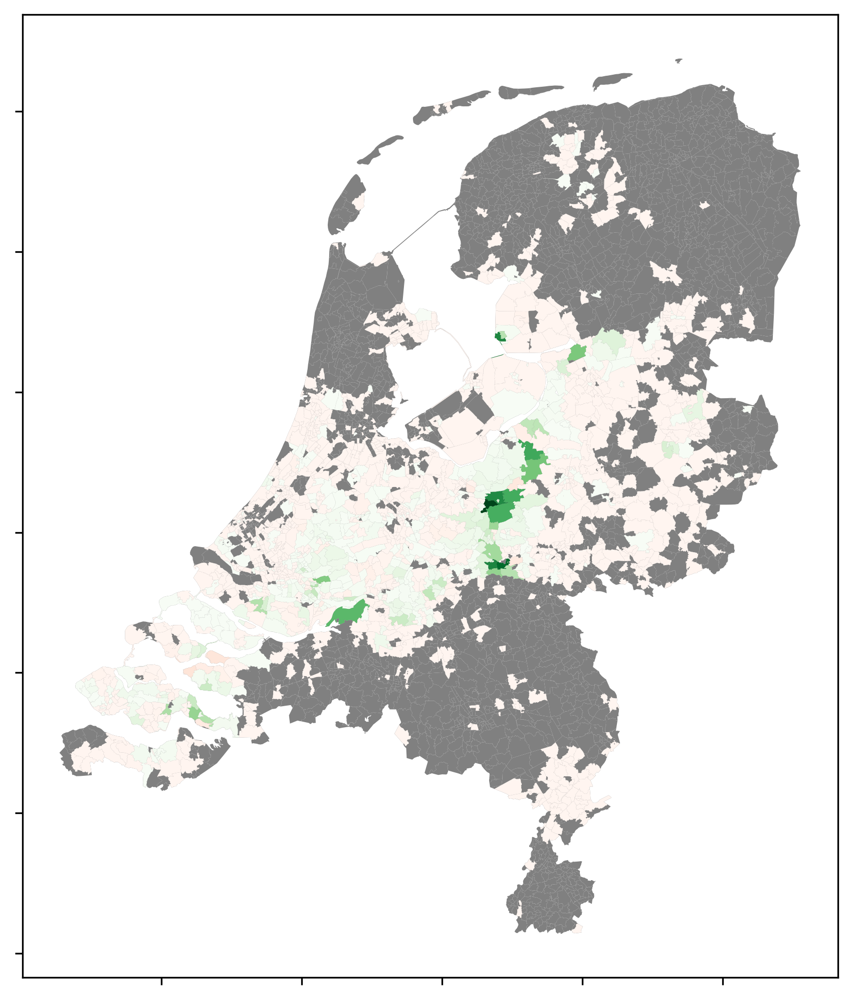

In [18]:
PC_Cases_NS, pc4shapes_NS = plot_resmap(loaded_cons, loaded_seeds)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
plotting.py:704: RuntimeWarning: divide by zero encount

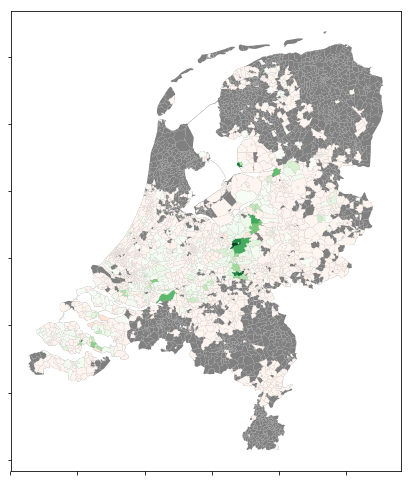

In [25]:
PC_Cases_NS, pc4shapes_NS = plot_resmap(loaded_cons, loaded_seeds)



/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63

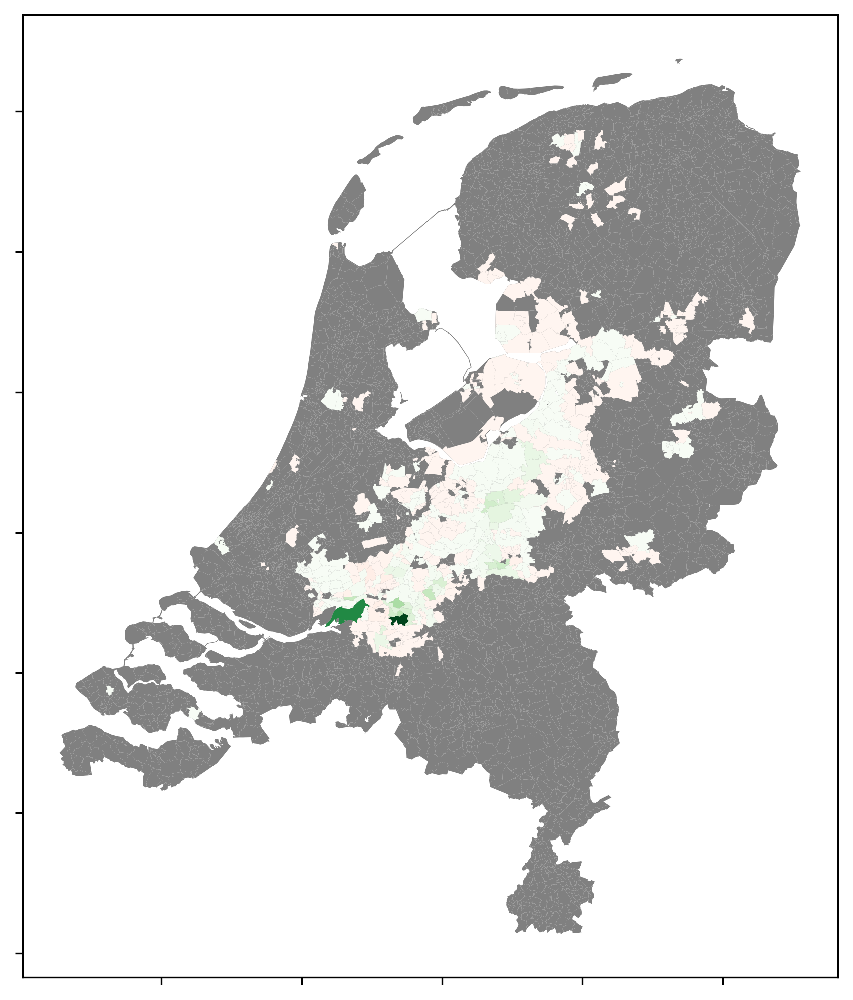

In [19]:
PC_Cases_NP, pc4shapes_NP = plot_resmap(loaded_cons_pc4, loaded_seeds_pc4)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


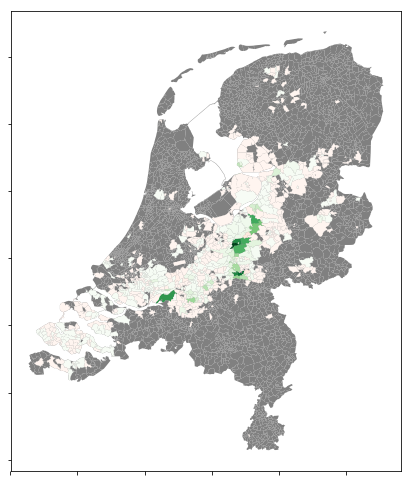

In [26]:
PC_Cases_NP, pc4shapes_NP = plot_resmap(loaded_cons_pc4, loaded_seeds_pc4)

/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/301408337.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  schools_pc4_cases['cases_' + str(run)] = schools_pc4_cases['run ' + str(run)] * schools_pc4_cases.TOTAAL * schools_pc4_cases.fs
/var/folders/1p/9vqy63

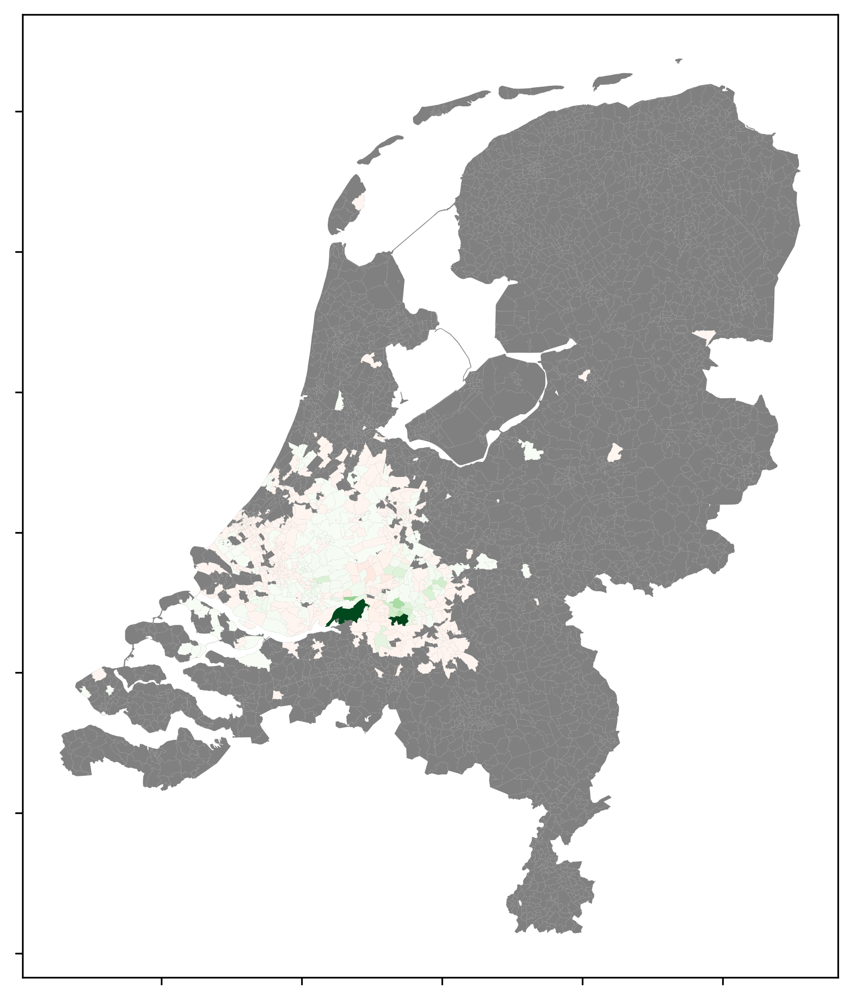

In [20]:
PC_Cases_SS, pc4shapes_SS = plot_resmap(spatial_cons, spatial_seeds)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


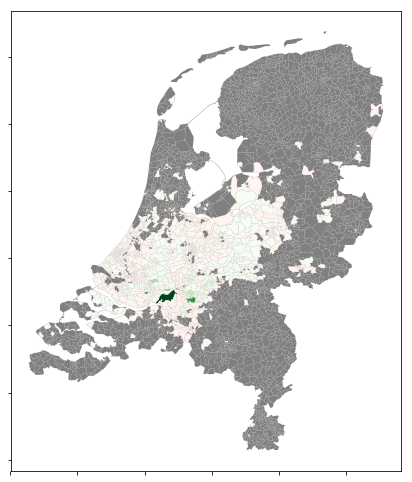

In [32]:
PC_Cases_SS, pc4shapes_SS = plot_resmap(spatial_cons, spatial_seeds)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:43: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:47: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:51: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


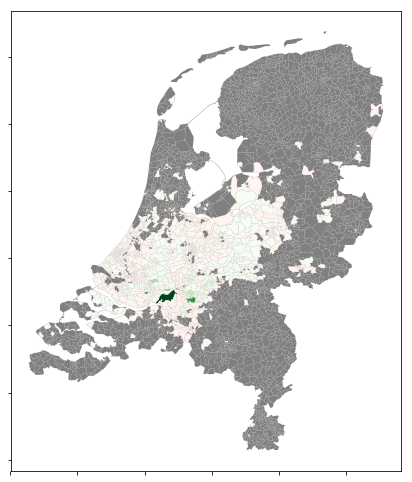

In [32]:
PC_Cases_SS, pc4shapes_SS = plot_resmap(spatial_cons, spatial_seeds)

In [25]:
rocs_SS = pl.roc_values_weighted(PC_Cases_SS,857)
ssvals_SS = np.array(rocs_SS)[:,[0,2]].T

rocs_NP = pl.roc_values_weighted(PC_Cases_NP,332)
ssvals_NP = np.array(rocs_NP)[:,[0,2]].T

rocs_NS = pl.roc_values_weighted(PC_Cases_NS,1000)
ssvals_NS = np.array(rocs_NS)[:,[0,2]].T

In [24]:
np.shape(PC_Cases_NS)

(3981, 1001)

In [26]:
rocsuw_SS = pl.roc_values(PC_Cases_SS,0,857 )
ssvalsuw_SS = np.array(rocsuw_SS)[:,[0,2]].T

rocsuw_NP = pl.roc_values(PC_Cases_NP,0,332)
ssvalsuw_NP = np.array(rocsuw_NP)[:,[0,2]].T

rocsuw_NS = pl.roc_values(PC_Cases_NS,0,1000)
ssvalsuw_NS = np.array(rocsuw_NS)[:,[0,2]].T

([<matplotlib.axis.XTick at 0x4f3fa1be0>,
 [Text(0.6, 0, '0.6'), Text(0.8, 0, '0.8'), Text(1.0, 0, '1.0')])

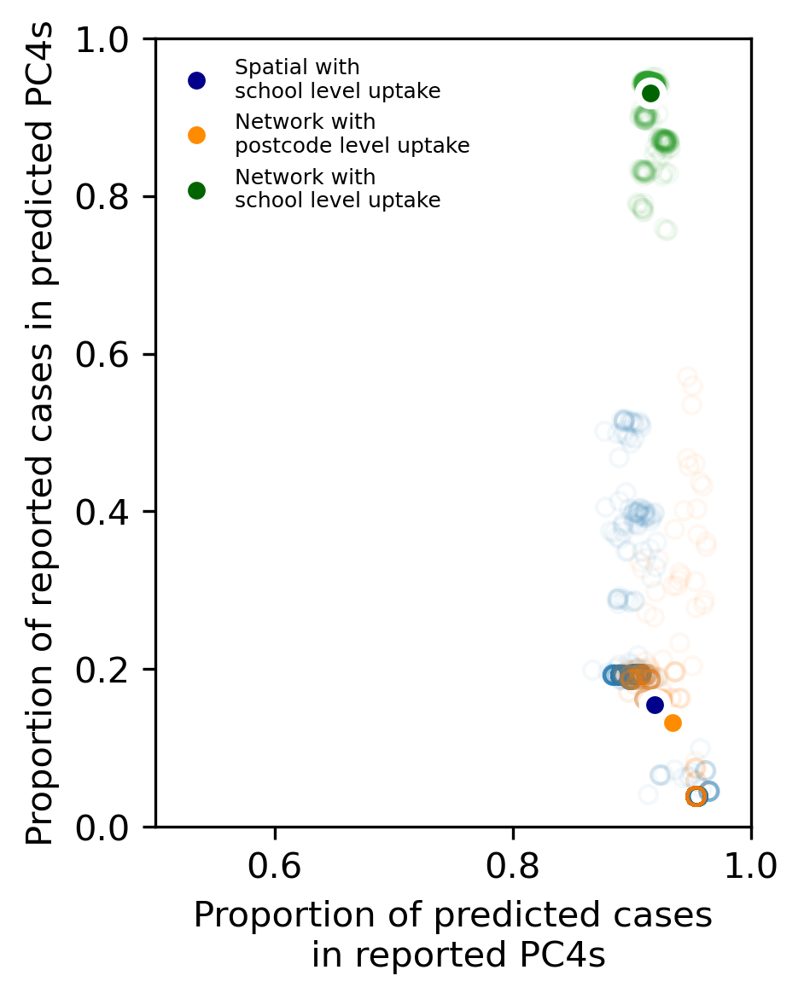

In [27]:
fig = plt.figure(figsize=[3,4], dpi=300)
ax = fig.add_subplot(111)
ax.plot(ssvals_SS[1], ssvals_SS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NP[1], ssvals_NP[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NS[1], ssvals_NS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)


ax.plot(np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue', label="Spatial with \nschool level uptake")
ax.plot(np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange', label="Network with \npostcode level uptake")
ax.plot(np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen', label="Network with \nschool level uptake")



ax.legend(loc = 2, fontsize=6, frameon=False)

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

([<matplotlib.axis.XTick at 0x3174af8b0>,
 [Text(0.6, 0, '0.6'), Text(0.8, 0, '0.8'), Text(1.0, 0, '1.0')])

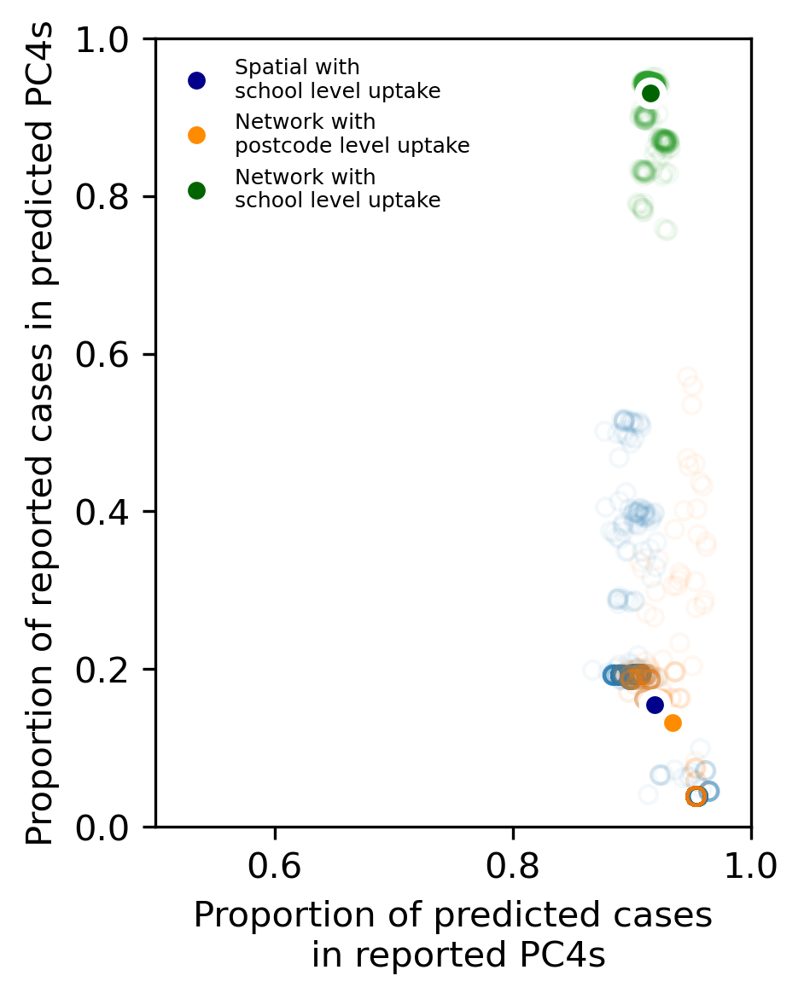

In [28]:
fig = plt.figure(figsize=[3,4], dpi=300)
ax = fig.add_subplot(111)
ax.plot(ssvals_SS[1], ssvals_SS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NP[1], ssvals_NP[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NS[1], ssvals_NS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)


ax.plot(np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue', label="Spatial with \nschool level uptake")
ax.plot(np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange', label="Network with \npostcode level uptake")
ax.plot(np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen', label="Network with \nschool level uptake")



ax.legend(loc = 2, fontsize=6, frameon=False)

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

([<matplotlib.axis.XTick at 0x1bd44be490>,
 <a list of 3 Text xticklabel objects>)

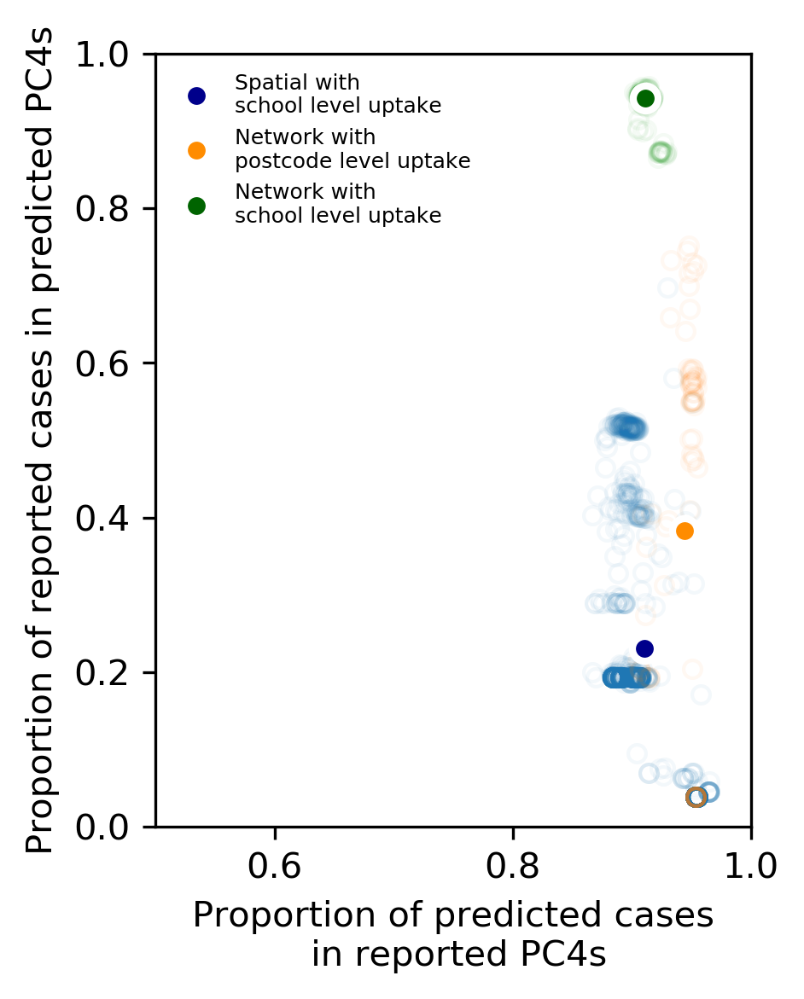

In [56]:
fig = plt.figure(figsize=[3,4], dpi=300)
ax = fig.add_subplot(111)
ax.plot(ssvals_SS[1], ssvals_SS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NP[1], ssvals_NP[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NS[1], ssvals_NS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)


ax.plot(np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue', label="Spatial with \nschool level uptake")
ax.plot(np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange', label="Network with \npostcode level uptake")
ax.plot(np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen', label="Network with \nschool level uptake")



ax.legend(loc = 2, fontsize=6, frameon=False)

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

([<matplotlib.axis.XTick at 0x6195e4700>,
 [Text(0.6, 0, '0.6'), Text(0.8, 0, '0.8'), Text(1.0, 0, '1.0')])

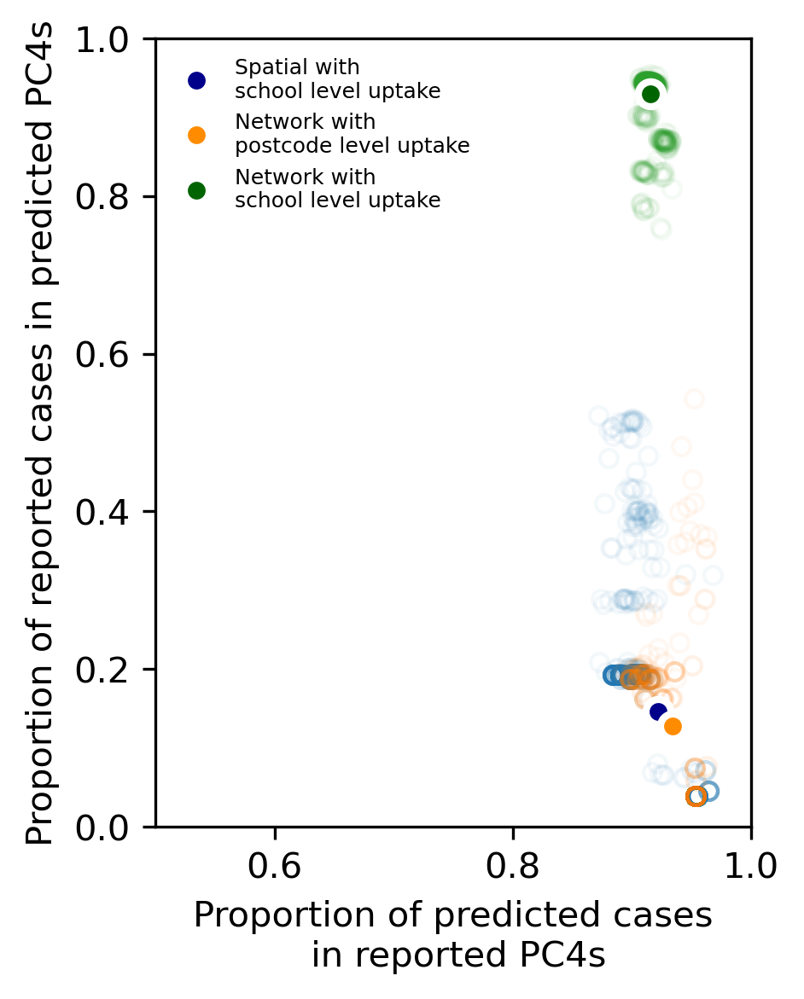

In [39]:
fig = plt.figure(figsize=[3,4], dpi=300)
ax = fig.add_subplot(111)
ax.plot(ssvals_SS[1], ssvals_SS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NP[1], ssvals_NP[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)
ax.plot(ssvals_NS[1], ssvals_NS[0], 'o', ms=5, alpha=0.05, mfc='none', label=None)


ax.plot(np.mean(ssvals_SS[1]), np.mean(ssvals_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue', label="Spatial with \nschool level uptake")
ax.plot(np.mean(ssvals_NP[1]), np.mean(ssvals_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange', label="Network with \npostcode level uptake")
ax.plot(np.mean(ssvals_NS[1]), np.mean(ssvals_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen', label="Network with \nschool level uptake")



ax.legend(loc = 2, fontsize=6, frameon=False)

plt.ylabel('Proportion of reported cases in predicted PC4s')
plt.xlabel('Proportion of predicted cases\n in reported PC4s')


plt.xlim([0.5,1])
plt.ylim([0,1])
plt.xticks(np.arange(0.6,1.2, 0.2))

In [42]:
leg = ax.get_legend()

([<matplotlib.axis.XTick at 0x4f03c7430>,
 [Text(0.0, 0, '0.0'),
  Text(0.2, 0, '0.2'),
  Text(0.4, 0, '0.4'),
  Text(0.6000000000000001, 0, '0.6'),
  Text(0.8, 0, '0.8'),
  Text(1.0, 0, '1.0')])

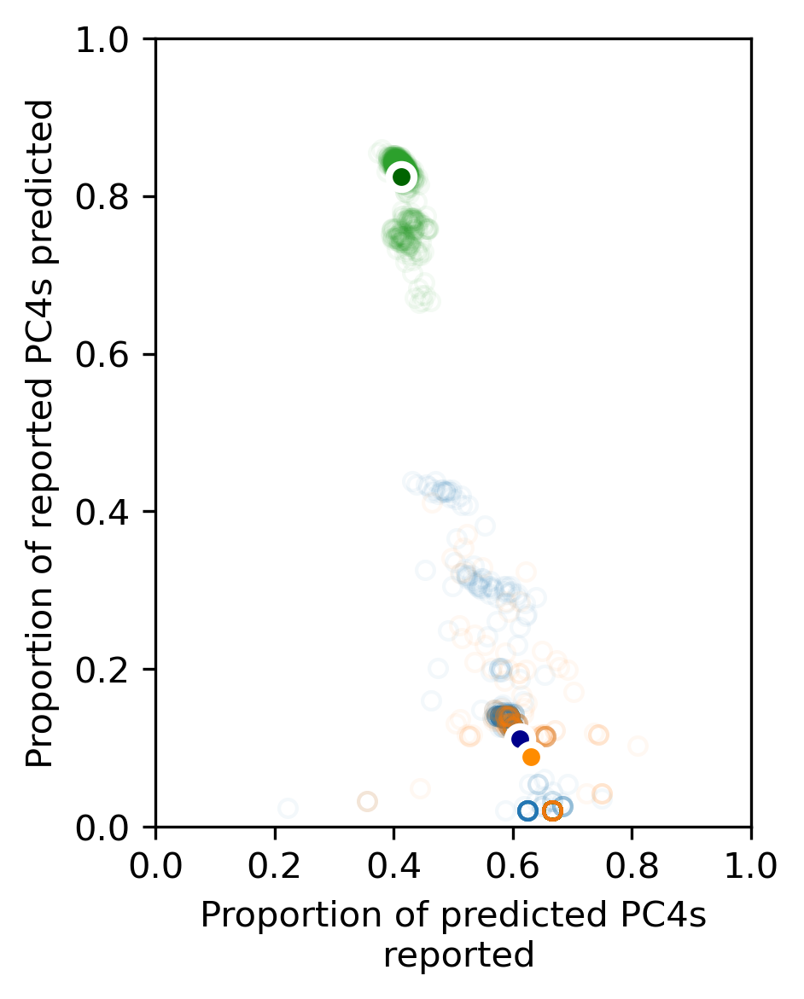

In [29]:
fig = plt.figure(figsize=[3,4], dpi=300)
plt.plot(ssvalsuw_SS[1], ssvalsuw_SS[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NP[1], ssvalsuw_NP[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NS[1], ssvalsuw_NS[0], 'o', ms=5, alpha=0.05, mfc='none')

plt.plot(np.mean(ssvalsuw_SS[1]), np.mean(ssvalsuw_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue')
plt.plot(np.mean(ssvalsuw_NP[1]), np.mean(ssvalsuw_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange')
plt.plot(np.mean(ssvalsuw_NS[1]), np.mean(ssvalsuw_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen')


#plt.legend(['SS', 'NP', 
            #'NS', 'SS - mean', 
            #'NS - mean', 'NP - mean'])

plt.ylabel('Proportion of reported PC4s predicted')
plt.xlabel('Proportion of predicted PC4s\n reported')





plt.xlim([0.,1])
plt.ylim([0,1])
plt.xticks(np.arange(0,1.2, 0.2))

([<matplotlib.axis.XTick at 0x1bc969a890>,
 <a list of 6 Text xticklabel objects>)

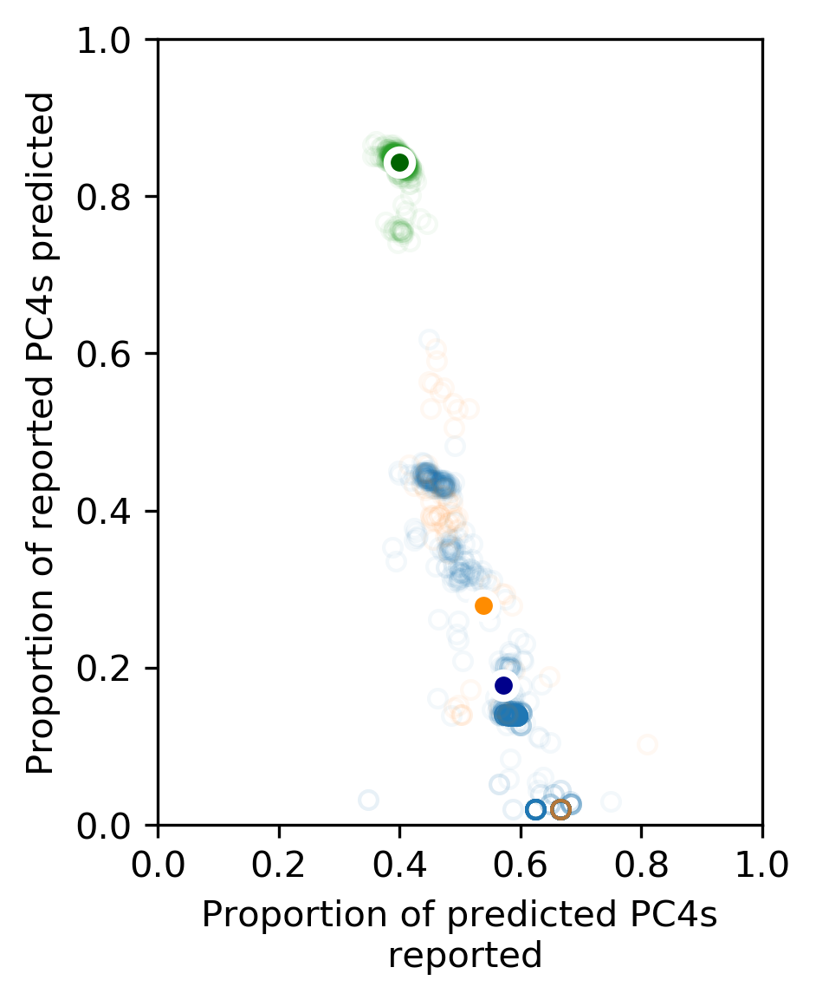

In [37]:
fig = plt.figure(figsize=[3,4], dpi=300)
plt.plot(ssvalsuw_SS[1], ssvalsuw_SS[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NP[1], ssvalsuw_NP[0], 'o', ms=5, alpha=0.05, mfc='none')
plt.plot(ssvalsuw_NS[1], ssvalsuw_NS[0], 'o', ms=5, alpha=0.05, mfc='none')

plt.plot(np.mean(ssvalsuw_SS[1]), np.mean(ssvalsuw_SS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkBlue')
plt.plot(np.mean(ssvalsuw_NP[1]), np.mean(ssvalsuw_NP[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkOrange')
plt.plot(np.mean(ssvalsuw_NS[1]), np.mean(ssvalsuw_NS[0]), 'o', ms=7, alpha=1, mec='white', mew=2, mfc='DarkGreen')


#plt.legend(['SS', 'NP', 
            #'NS', 'SS - mean', 
            #'NS - mean', 'NP - mean'])

plt.ylabel('Proportion of reported PC4s predicted')
plt.xlabel('Proportion of predicted PC4s\n reported')





plt.xlim([0.,1])
plt.ylim([0,1])
plt.xticks(np.arange(0,1.2, 0.2))

In [64]:
FSList = [models.op_fs(p, 15.) for p in np.arange(0, 1., 0.001)]

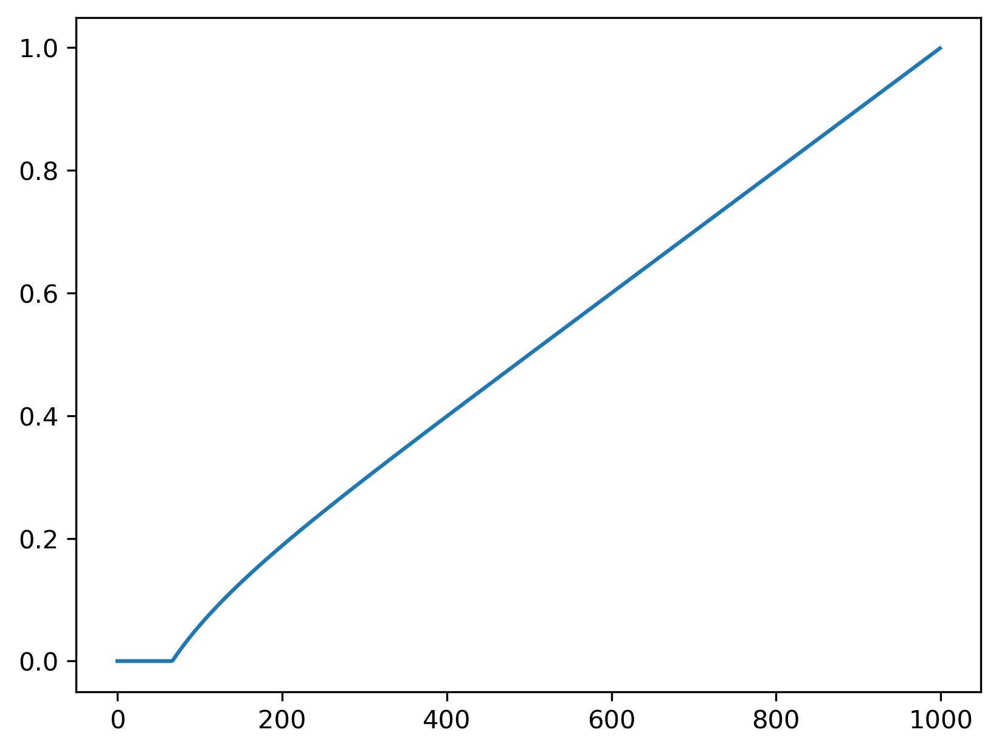

In [32]:
plt.plot(FSList)

In [34]:
num_frame = transnet.school_data[['BRIN', 'leerlingen']].set_index('BRIN')
vacc_df_s = make_risk_df(loaded_preds, loaded_pseeds, loaded_pvacc, vacc_dict_sample)

08RK00
03OA00
06ES00
04RC00
09TY00
07CO00
27RP00
10EU00
03BI00
07ZZ00
00CU00
26MW00
07PE00
07OK00
16NK00
09TY00
06GE00
00EI00
15CF00
00GQ00
03IA00
04LD00
00IM00
07MF00
05WR00
03LN00
02EA00
06EE00
03TD00
04AM00
07ZU00
09ZG00
19VR00
21OM00
07KB00
03HY00
23VL03
16TS03
07IA00
16TV01
09DD00
03JY00
06WX00
01RL01
06OS00
03MF00
24DF00
07OX00
08BF00
08JC00
24DF00
28CG00
03MF00
06GV00
09JH00
19RJ00
05RW00
18JG00
05WV00
06WX00
02EA03
04UK00
04WQ00
23VL03
08VW00
23FV00
03HY00
07JN00
04LI00
04UB00
07AA00
06EA00
26NU00
03IA00
06OU00
00HA00
07MF00
00IM00
05OK00
15CF00
04SG00
26MV00
00EM00
06RM00
06UF00
23VL02
03YZ00
06FI00
26NC00
07OK00
06IW00
24DE01
02GP05
07OE00
01RL00
19TB00
06KQ00
00EI00
21NL00
23GL00
03RB00
07CX00
07AL00
07MF00
03JY00
11VO00
03LN00
04RC00
00EI00
06ES00
08VW00
07CO00
06EA00
06YK00
09NZ00
06IW00
07ZZ00
03JY06
09JI00
27RP00
09JK00
09UE00
18JG00
10KE00
16TS02
09TY00
06UF00
07OK00
30TF00
03WO02
11DO00
00WH01
23VL03
03HY00
16TS03
19VI00
06WX00
04CN00
07KY00
04EW00
06VJ00
07OX00
08BF00

In [35]:
vacc_frame['median'] = vacc_frame.median(axis=1)
vacc_frame['p25'] = [st.scoreatpercentile(vacc_frame.loc[i], 25) for i in vacc_frame.index]
vacc_frame['p75'] = [st.scoreatpercentile(vacc_frame.loc[i], 75) for i in vacc_frame.index]

/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/1698788875.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  vacc_frame['median'] = vacc_frame.median(axis=1)
/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/1698788875.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  vacc_frame['p25'] = [st.scoreatpercentile(vacc_frame.loc[i], 25) for i in vacc_frame.index]
/var/folders/1p/9vqy63ms31n2xbfhkrvfq9qr0000gs/T/ipykernel_26315/1698788875.py:3: PerformanceWarning: DataFrame is highly fragmented.  Th

In [36]:
vacc_df_s.vacc = pd.to_numeric(vacc_df_s.vacc)

In [37]:
vacc_size_seed = pd.concat([vacc_frame[['median', 'p25', 'p75']], vacc_df_s.groupby('Seed').sum()/1000.], axis=1)

In [38]:
vacc_size_seed

,median,p25,p75,vacc,schools,proportion of seeds
02YR05,0.987843,0.969876,0.994423,NaN,NaN,NaN
06NH00,0.996654,0.992298,0.998493,NaN,NaN,NaN
10DR00,0.993067,0.989055,0.996461,NaN,NaN,NaN
10HK00,0.996005,0.992017,0.998335,NaN,NaN,NaN
10VH00,0.995803,0.988990,0.997892,NaN,NaN,NaN
...,...,...,...,...,...,...
30PP02,0.994555,0.984467,0.997876,NaN,NaN,NaN
30PP04,0.996343,0.992866,0.998008,NaN,NaN,NaN
30UB00,0.992899,0.976865,0.996612,NaN,NaN,NaN
30UD00,0.991272,0.980204,0.995895,NaN,NaN,NaN


In [39]:
FS_df_net = make_FS_df(loaded_cons, loaded_seeds, loaded_vacc, transnet.vacc_dict_samples)

In [40]:
FS_df_spat = make_FS_df(spatial_cons, spatial_seeds, spatial_vacc, transnet.vacc_dict_samples)

In [41]:
#FS_df_spat.vacc = pd.to_numeric(FS_df_spat.vacc)
import re
from functools import reduce

FS_df_net.vacc =  pd.to_numeric([re.sub('_', '', y) for y in FS_df_net.vacc])
FS_df_spat.vacc =  pd.to_numeric([re.sub('_', '', y) for y in FS_df_spat.vacc])

In [86]:
new_vaccs

array([78, 99, 63, ..., 18, 41, 24])

In [42]:
vacc_size_FS_spa = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_spat.groupby('Seed').sum()/1000.], axis=1)
vacc_size_FS_net = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_net.groupby('Seed').sum()/1000.], axis=1)
#vacc_size_FS_yso = pd.concat([vacc_frame[['median', 'p25', 'p75']], FS_df_yso.query('vacc == @ys').groupby('Seed').sum()/1000.], axis=1)

In [43]:
def plot_children(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'children', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'children', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'children', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean number of children infected')
    ax.set_xlabel('Median vaccination uptake')

In [44]:
def plot_schools(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'schools', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'schools', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'schools', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean number of schools infected')
    ax.set_xlabel('Median vaccination uptake')


In [45]:
def plot_seeds(vacc_size_FS):
    fig=plt.figure(dpi=300, figsize=[5,3])
    ax = vacc_size_FS.query('index in @Reformed_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='r', ax=fig.gca(), alpha=0.5)
    vacc_size_FS.query('index in @Anthro_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='Teal', ax=ax, alpha=0.5)
    vacc_size_FS.query('index not in @Anthro_BRIN and index not in @Reformed_BRIN').plot('median', 'proportion of seeds', kind='scatter', color='Grey', ax=ax, alpha=0.5)

    #plt.vlines(x=vacc_size_1k['median'], ymin=vacc_size_1k['Mean FS'] - vacc_size_1k['p25 FS'], ymax=vacc_size_1k['Mean FS'] + vacc_size_1k['p75 FS'])

    #ax.set_yscale('log')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel('Mean proportion of possible seeds')
    ax.set_xlabel('Median vaccination uptake')

In [46]:
Reformed_BRIN = schools_data.query('Denomination == "Reformatorisch"').BRIN
Anthro_BRIN = schools_data.query('Denomination == "Antroposofisch"').BRIN

median                  0.866247
p25                     0.834152
p75                     0.910065
vacc                   48.670000
schools                 3.088000
proportion of seeds     0.007118
dtype: float64
median                  0.733744
p25                     0.653884
p75                     0.803475
vacc                   16.672350
schools                 0.856350
proportion of seeds     0.001638
dtype: float64
median                   0.950065
p25                      0.915739
p75                      0.972610
vacc                    49.500000
schools                159.611000
proportion of seeds      0.386388
dtype: float64
median                   0.603637
p25                      0.496977
p75                      0.699304
vacc                    40.320821
schools                111.744242
proportion of seeds      0.269769
dtype: float64


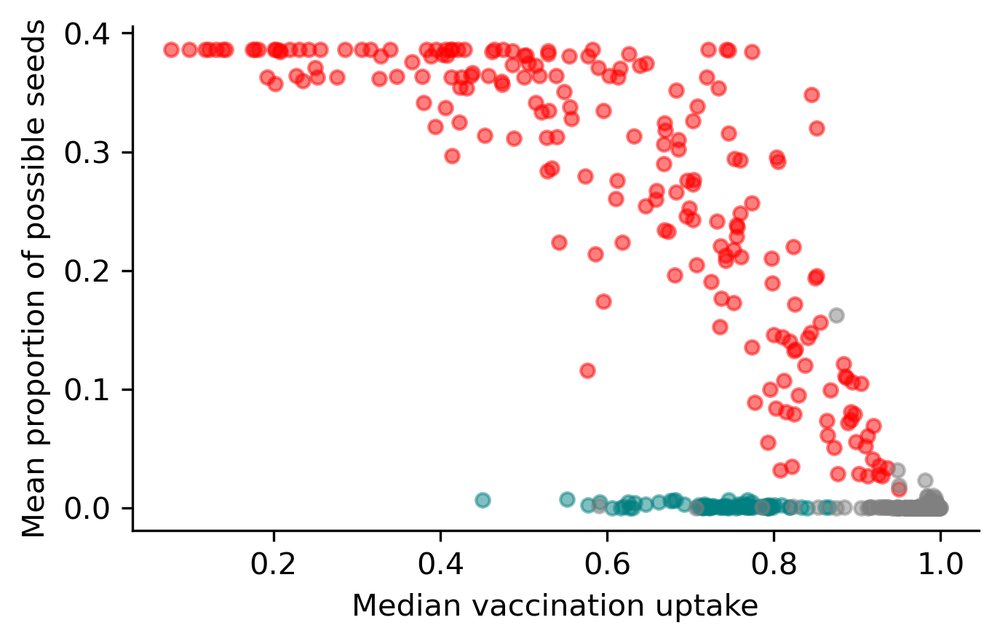

In [47]:
plot_seeds(vacc_size_seed)

print(vacc_size_seed.query('index in @Anthro_BRIN').max())
print(vacc_size_seed.query('index in @Anthro_BRIN').mean())
print(vacc_size_seed.query('index in @Reformed_BRIN').max())
print(vacc_size_seed.query('index in @Reformed_BRIN').mean())

median                  0.866247
p25                     0.834152
p75                     0.910065
vacc                   48.807000
schools                 5.085000
proportion of seeds     0.007122
dtype: float64
median                  0.733744
p25                     0.653884
p75                     0.803475
vacc                   19.335185
schools                 1.229062
proportion of seeds     0.001715
dtype: float64
median                   0.950065
p25                      0.915739
p75                      0.972610
vacc                    49.500000
schools                192.128000
proportion of seeds      0.385794
dtype: float64
median                   0.603637
p25                      0.496977
p75                      0.699304
vacc                    40.339447
schools                133.908769
proportion of seeds      0.267954
dtype: float64


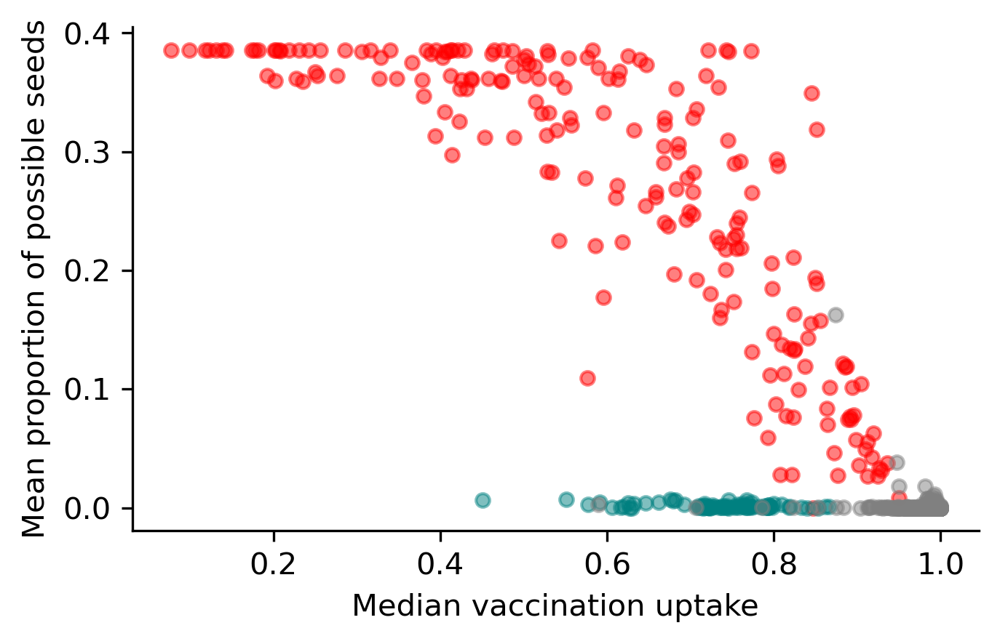

In [100]:
plot_seeds(vacc_size_seed)

print(vacc_size_seed.query('index in @Anthro_BRIN').max())
print(vacc_size_seed.query('index in @Anthro_BRIN').mean())
print(vacc_size_seed.query('index in @Reformed_BRIN').max())
print(vacc_size_seed.query('index in @Reformed_BRIN').mean())

4.325

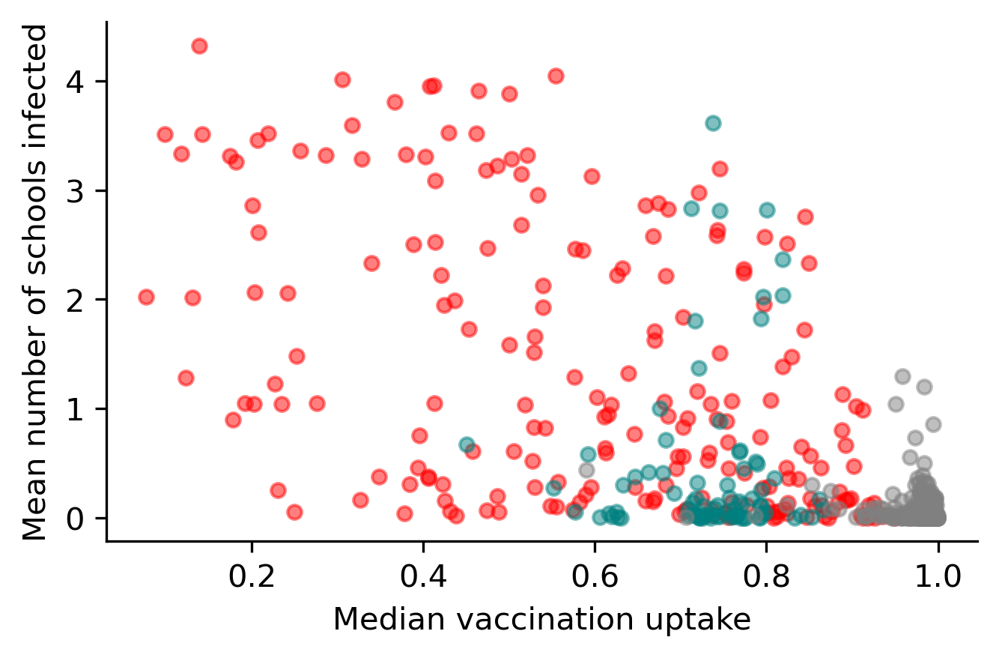

In [48]:
plot_schools(vacc_size_FS_spa)
vacc_size_FS_spa.schools.max()

median        0.866247
p25           0.834152
p75           0.910065
vacc         48.670000
primary       3.034000
secondar      2.015000
schools       1.062000
children    462.591478
dtype: float64
median      0.450661
p25         0.291091
p75         0.597869
vacc        0.047000
primary     0.001000
secondar    0.001000
schools     0.000000
children    0.016022
dtype: float64


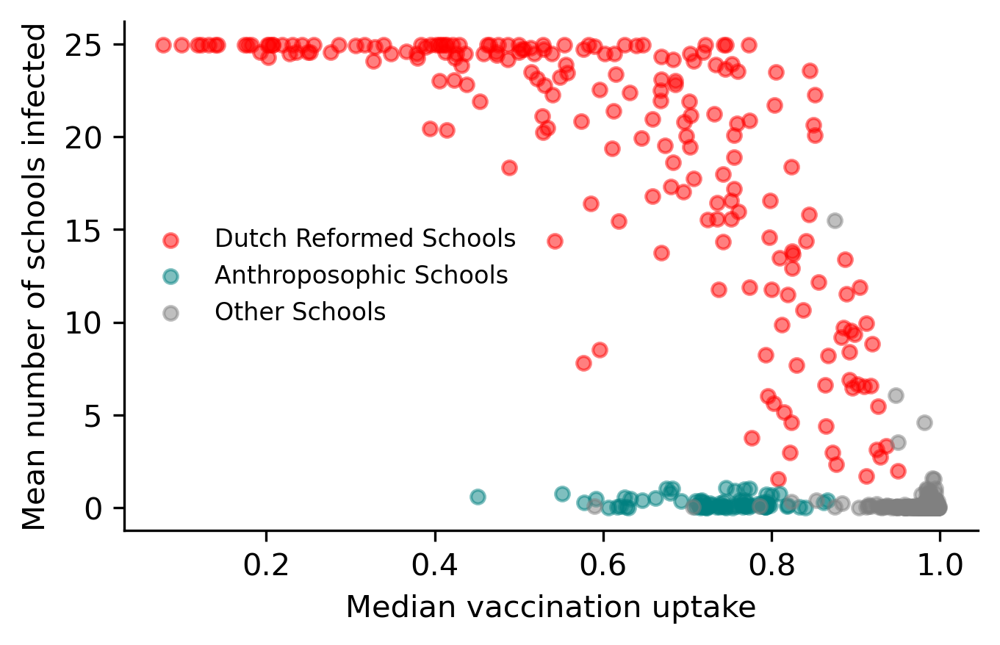

In [49]:
plot_schools(vacc_size_FS_net)
plt.legend(['Dutch Reformed Schools', 'Anthroposophic Schools', 'Other Schools'], fontsize=8, frameon=False)
vacc_size_FS_net.schools.max()
print(vacc_size_FS_net.query('index in @Anthro_BRIN').max())
print(vacc_size_FS_net.query('index in @Anthro_BRIN').min())

median         0.866247
p25            0.834152
p75            0.910065
vacc          44.817000
primary       14.121000
secondar      11.307000
schools        3.613000
children    3751.456741
dtype: float64
median      0.450661
p25         0.291091
p75         0.597869
vacc        0.051000
primary     0.003000
secondar    0.003000
schools     0.000000
children    0.141233
dtype: float64


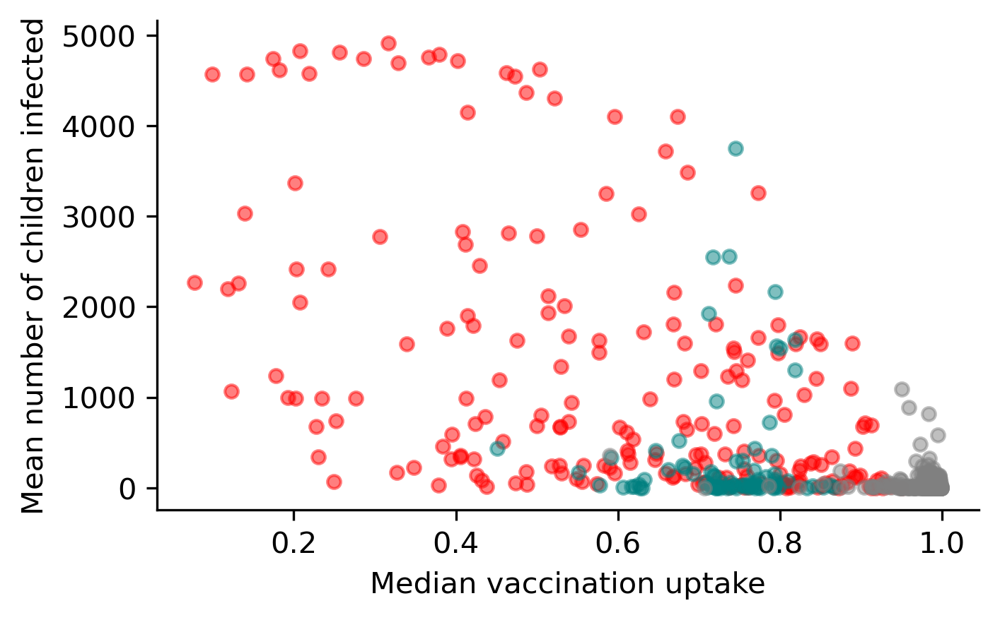

In [50]:
plot_children(vacc_size_FS_spa)
vacc_size_FS_spa.children.max()
print(vacc_size_FS_spa.query('index in @Anthro_BRIN').max())
print(vacc_size_FS_spa.query('index in @Anthro_BRIN').min())

23505.50328019344

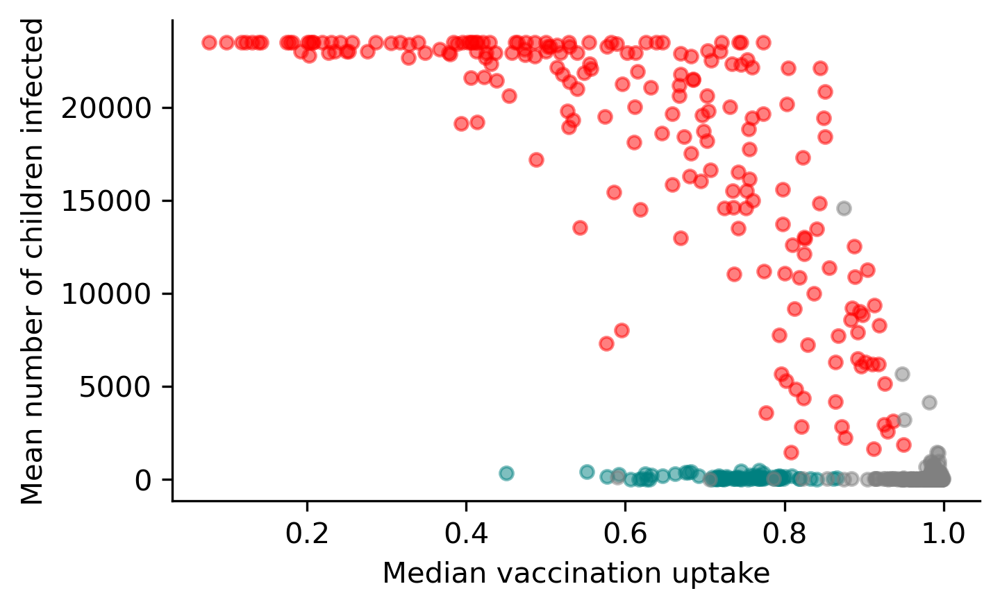

In [51]:
plot_children(vacc_size_FS_net)
vacc_size_FS_net.children.max()

In [52]:
FS_df_net.to_csv('outputs/FS_df_net.csv')
FS_df_spat.to_csv('outputs/FS_df_spat.csv')

In [53]:
PC_Cases_NP.to_csv('outputs/PC_Cases_NP.csv')
PC_Cases_NS.to_csv('outputs/PC_Cases_NS.csv')
PC_Cases_SS.to_csv('outputs/PC_Cases_SS.csv')

In [1]:
PC_Cases_NP

NameError: name 'PC_Cases_NP' is not defined